In [7]:
try:
    import numpy as np
    import pandas as pd
    
except:
    !pip install numpy
    !pip install pandas
    
    import numpy as np
    import pandas as pd

In [8]:
credit_card_df = pd.read_csv("card_transdata.csv")
credit_card_df = credit_card_df.rename(columns={"distance_from_home":"Distance From Home",
                                                "distance_from_last_transaction":"Distance From Last Transaction",
                                                "ratio_to_median_purchase_price":"Ratio to Median Purchase Price","repeat_retailer":"Repeat Retailer",
                                                "used_chip":"Used Chip",
                                                "used_pin_number":"Used Pin Number", 
                                                "online_order": "Online Order", 
                                                "fraud":"Fraud"})
credit_card_df.head(10)

,Distance From Home,Distance From Last Transaction,Ratio to Median Purchase Price,Repeat Retailer,Used Chip,Used Pin Number,Online Order,Fraud
0,57.877857,0.311140,1.945940,1.0,1.0,0.0,0.0,0.0
1,10.829943,0.175592,1.294219,1.0,0.0,0.0,0.0,0.0
2,5.091079,0.805153,0.427715,1.0,0.0,0.0,1.0,0.0
3,2.247564,5.600044,0.362663,1.0,1.0,0.0,1.0,0.0
4,44.190936,0.566486,2.222767,1.0,1.0,0.0,1.0,0.0
5,5.586408,13.261073,0.064768,1.0,0.0,0.0,0.0,0.0
6,3.724019,0.956838,0.278465,1.0,0.0,0.0,1.0,0.0
7,4.848247,0.320735,1.273050,1.0,0.0,1.0,0.0,0.0
8,0.876632,2.503609,1.516999,0.0,0.0,0.0,0.0,0.0
9,8.839047,2.970512,2.361683,1.0,0.0,0.0,1.0,0.0


1. Using Pandas to read the csv and renaming columns to look cleaner
 - if there were more features, i would iterate throigh column names and search for "_" and replace with space, but it wasn't necessary here
2. Prints first 10 rows to make sure the file is read correctly

In [9]:
X = credit_card_df.loc[:, ~credit_card_df.columns.isin(["Fraud"])]    # Select all rows and remove the columns "Time", "Class"
y = credit_card_df.loc[:, "Fraud"]   # Select all rows and the column "Class"



1. Selects all columns that aren't fraud, and saves it to X
2. Selects fraud column and saves it to y

In [10]:
try:
    from sklearn.model_selection import train_test_split

    # Oversampling and undersampling
    from imblearn.over_sampling import RandomOverSampler, SMOTE
    from imblearn.under_sampling import RandomUnderSampler, NearMiss
    from collections import Counter
    
except:
    !pip install sklearn
    !pip install -U imbalanced-learn
    !pip install collections
    
    from sklearn.model_selection import train_test_split
    from imblearn.over_sampling import RandomOverSampler, SMOTE
    from imblearn.under_sampling import RandomUnderSampler, NearMiss
    from collections import Counter

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

print("The number of training data record is:", X_train.shape[0])    # Return number of rows/records
print("The number of test data record is:", X_test.shape[0])
print("The training dataset has", str(Counter(y_train)[0]), "non-fraudulent transactions (majority class) and", 
      str(Counter(y_train)[1]), "fraudulent transactions (minority class).")


The number of training data record is: 700000
The number of test data record is: 300000
The training dataset has 638690 non-fraudulent transactions (majority class) and 61310 fraudulent transactions (minority class).


1. Splits the dataset into a testing set and training set, testing set is 0.3 of the total. Random state is simply a seed so that if I run it again, the same values are saved to each set
2. Prints the "shape" of the X_train's and X_test's first dimension
3. Prints the count of y_train and y_test to identify how many non-fraud and fraud values there are

In [12]:
# Randomly under sample the majority class
rus = RandomUnderSampler(random_state = 0)
X_train_rus, y_train_rus = rus.fit_resample(X_train, y_train)

rus_df = pd.concat([pd.DataFrame(X_train_rus), pd.DataFrame(y_train_rus)], axis=1)
rus_csv = rus_df.to_csv("rus.csv", index=False)

# Check the number of records after undersampling
print("Number of fradulent transactions:", str(Counter(y_train_rus)[1]))
print("Number of non-fradulent transactions:", str(Counter(y_train_rus)[0]))

Number of fradulent transactions: 61310
Number of non-fradulent transactions: 61310


1. The randomly undersampled X_train and y_train to new variables X_train_rus and y_train_rus
2. Create a new dataframe called rus_df combining single arrays, save to csv file
3. Prints count of fraud and non-fraud values to check that the new dataset is balanced

In [13]:
# Under sample the majority class
nearmiss = NearMiss(version = 3)  # There're 3 versions. We're using version 3
X_train_nearmiss, y_train_nearmiss = nearmiss.fit_resample(X_train, y_train)

# Check the number of records after undersampling
print("Number of fradulent transactions:", str(Counter(y_train_nearmiss)[1]))
print("Number of non-fradulent transactions:", str(Counter(y_train_nearmiss)[0]))

Number of fradulent transactions: 61310
Number of non-fradulent transactions: 43349


C:\Users\ashkm\anaconda3\lib\site-packages\imblearn\under_sampling\_prototype_selection\_nearmiss.py:203: UserWarning: The number of the samples to be selected is larger than the number of samples available. The balancing ratio cannot be ensure and all samples will be returned.
  warnings.warn(


In [14]:
# Randomly under sample the majority class
ros = RandomOverSampler(random_state = 0)
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)

# Check the number of records after undersampling
print("Number of fradulent transactions:", str(Counter(y_train_ros)[0]))
print("Number of non-fradulent transactions:", str(Counter(y_train_ros)[1]))

Number of fradulent transactions: 638690
Number of non-fradulent transactions: 638690


In [15]:
# Randomly under sample the majority class
smote = SMOTE(random_state = 0)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Check the number of records after undersampling
print("Number of fradulent transactions:", str(Counter(y_train_smote)[0]))
print("Number of non-fradulent transactions:", str(Counter(y_train_smote)[1]))

Number of fradulent transactions: 638690
Number of non-fradulent transactions: 638690


Last 3 cells also create new variables for resampled data and prints the count to check for rebalance

# MLP Classifier

In [16]:
try:
    from sklearn.neural_network import MLPClassifier
    from sklearn.metrics import accuracy_score, classification_report
    from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
    from statistics import mean
    import matplotlib.pyplot as plt
    import seaborn as sns
    
except:
    !pip instal sklearn
    !pip install statistics
    !pip install matplotlib
    !pip install seaborn
    
    from statistics import mean
    from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
    import matplotlib.pyplot as plt
    import seaborn as sns

Imports MLP classifier, necessary metrics, and visualization packages

In [17]:
def confidence_class(predicted_probability_mlp_sampling):
    confidence_class0 = predicted_probability_mlp_sampling[:,0]  # First column is probability for non-fradulent class
    confidence_class1 = predicted_probability_mlp_sampling[:,1]  # Second column is probability fradulent class
    
    return confidence_class0, confidence_class1

Creates a function to return confidence class that takes parameter which is the predicted probability calculated by   predict.proba()


In [18]:
def plot_confidence_score_histogram(predicted_probability_mlp_sampling):
    confidence_class0, confidence_class1 = confidence_class(predicted_probability_mlp_sampling)
    
    fig, ax = plt.subplots(1, 2, figsize = (16, 10))


    # Plot histogram for class 0 probability score
    class0_hist = sns.histplot(confidence_class0,
                               alpha = 0.4,
                               color = "green",
                               edgecolor = "white",
                               binwidth = 0.025,
                               ax = ax[0])

    # Set axis labels and title
    class0_hist.set(xlabel = "Probability score", 
                    ylabel = "Number of prediction",
                    title = "Class 0 probability score")


    # Plot histogram for class 1 probability score
    class1_hist = sns.histplot(confidence_class1,
                               alpha = 0.4,
                               color = "navy",
                               edgecolor = "white",
                               binwidth = 0.025,
                               ax = ax[1])

    # Set axis labels and title
    class1_hist.set(xlabel = "Probability score", 
                    ylabel = "Number of prediction",
                    title = "Class 1 probability score")


    fig.suptitle("Distribution of probability score for class 0 and 1")  # Main title
    plt.tight_layout()
    plt.show();

Creates a function to plot a confidence score histogram which takes in parameter predicted probabiliy

In [19]:
def model_metrics(mlp_sampling_accuracy_score, predicted_probability_mlp_sampling, predicted_mlp_sampling):
    confidence_class0, confidence_class1 = confidence_class(predicted_probability_mlp_sampling)
    
    adjusted_confidence_class0 = [1-prob if prob < 0.5 else prob for prob in confidence_class0]
    adjusted_confidence_class1 = [1-prob if prob < 0.5 else prob for prob in confidence_class1]

    print("The accuracy score for Random Under Sampling is", mlp_sampling_accuracy_score)

    # Notice the score for each class is the same 
    print("The average confidence score of predicting class 0 - the non-fraudulent transactions - is", mean(adjusted_confidence_class0))
    print("The average confidence score of predicting class 1 - the fraudulent transactions - is", mean(adjusted_confidence_class1))
    print(classification_report(y_test, predicted_mlp_sampling))

Creates a function to output metrics of a model.
1. Takes in accuracy score, predicted probability, and confidence score
2. runs confidence class function on the predicted probability and assings output to 2 variables
3. Adjusting the confidence classes to account for inaccurate classing. Ex. if model has 1 fraud and 1 no fraud, but predicts fraud as no fraud and no fraud as fraud, it still has 1 for each, yet is 0% accurate. this adjusts for this case.

In [20]:
def plot_confusion_matrix(y_test, predict_mlp_sampling):
    fig, axs = plt.subplots(1, 3, figsize = (20, 5))   # Don't set x = y for figsize since legend can affect plot

    # Non-normalized confusion matrix
    cm_raw = confusion_matrix(y_test, predict_mlp_sampling)
    cmd_raw = ConfusionMatrixDisplay(cm_raw, 
                                     display_labels = ["Non-fraudlent", "Fraudlent"])

    cmd_raw.plot(ax = axs[0], cmap = "Blues")
    cmd_raw.ax_.set(title = "Non-normalized confusion matrix", 
                    xlabel = "Predicted", 
                    ylabel = "True")


    # Normalized confusion matrix over true conditions
    cm_normalized_true = confusion_matrix(y_test, predict_mlp_sampling, normalize = "true")
    cmd_normalized_true = ConfusionMatrixDisplay(cm_normalized_true, 
                                                 display_labels = ["Non-fraudlent", "Fraudlent"])

    cmd_normalized_true.plot(ax = axs[1], cmap = "Greens")
    cmd_normalized_true.ax_.set(title = "Normalized confusion matrix over true conditions", 
                                xlabel = "Predicted", 
                                ylabel = "True")


    # Normalized confusion matrix over predicted conditions
    cm_normalized_pred = confusion_matrix(y_test, predict_mlp_sampling, normalize = "pred")
    cm_normalized_pred = ConfusionMatrixDisplay(cm_normalized_pred, 
                                                display_labels = ["Non-fraudlent", "Fraudlent"])

    cm_normalized_pred.plot(ax = axs[2], cmap = "BuPu")
    cm_normalized_pred.ax_.set(title = "Normalized confusion matrix over predicted conditions", 
                               xlabel = "Predicted", 
                               ylabel = "True")

    plt.tight_layout()
    plt.show();

Creates a function to plot confusion matrices
1. first matrix will be total count
2. second matrix will be over true conditions (recall)
3. third matrix will be over total positives (precision)

For this dataset, recall is more important because we want to minimize false negatives. It is better to mark a non fraud case as fraud and notify the user rather than mark a fraud case non-fraud.

# SHAP

In [21]:
#insert shap import
try:
    import shap
    
except:
    !pip install shap
    import shap

In [22]:
#insert shap function
def plot_SHAP(shape_values_sampling):
    feature_names = [a + ": " + str(b) for a,b in zip(X.columns, np.abs(shape_values_sampling.values).mean(0).round(2))]   # Include mean SHAP values


    # Plot summary plot
    shap.summary_plot(shape_values_sampling.values, 
                      X_test[0:30000], 
                      max_display = X.shape[1], 
                      feature_names = feature_names)

    # Plot feature importance bar chart
    shap.summary_plot(shape_values_sampling.values, X_test[0:30000], plot_type = "bar") 

imports or downloads shap, creates a function to plot it. 
Creates linked list to title the feature name, combining the features and its absolute values rounded to 2 decimals

plots the bar graph for the first 30,000 values in X_test

# LIME

In [23]:
try:
    import lime
    from lime import lime_tabular
    import warnings
    from IPython.display import display, HTML
except:
    !pip install lime
    !pip install warnings
    !pip install ipython
    
    import lime
    from lime import lime_tabular
    import warnings
    from IPython.display import display, HTML
    
warnings.filterwarnings("ignore")

In [24]:
def plot_LIME(X_train, X, X_test, index, mlp_sampling):
    
    explainer = lime_tabular.LimeTabularExplainer(
        training_data = np.array(X_train),   
        feature_names = X.columns,
        class_names = [0, 1],
        mode = "classification"
    )
    
    exp = explainer.explain_instance(
        data_row = X_test.iloc[index],   # Non-fraudulent/fraudulent instance
        predict_fn = mlp_sampling.predict_proba
    )

    exp.show_in_notebook(show_table = True)   # It won't display the table on Github 
    exp.as_pyplot_figure()
    plt.show();

In [25]:
y_test.head()

157105    1.0
374554    0.0
688694    0.0
265381    0.0
955415    1.0
Name: Fraud, dtype: float64

1. Imports/downloads lime
2. creates a function to plot the lime values, takes in training values, testing values, an index, and a model
3. printing the first 5 values so I can identify a fraudulent and non fraudlent case to plot both with LIME.

# Control Group (No Resampling)

In [26]:
mlp_none = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(8, 2), random_state=11,max_iter=10000)
mlp_none.fit(X_train.to_numpy(),y_train.to_numpy())
predicted_mlp_none = mlp_none.predict(X_test.to_numpy())
mlp_none_accuracy_score = accuracy_score(predicted_mlp_none,y_test)
predicted_probability_mlp_none = mlp_none.predict_proba(X_test)


In [27]:
model_metrics(mlp_none_accuracy_score, predicted_probability_mlp_none, predicted_mlp_none)

The accuracy score for Random Under Sampling is 0.93743
The average confidence score of predicting class 0 - the non-fraudulent transactions - is 0.9401082089384052
The average confidence score of predicting class 1 - the fraudulent transactions - is 0.9401082089384052
              precision    recall  f1-score   support

         0.0       0.95      0.99      0.97    273907
         1.0       0.76      0.41      0.53     26093

    accuracy                           0.94    300000
   macro avg       0.85      0.70      0.75    300000
weighted avg       0.93      0.94      0.93    300000



1. assigns mlp classifier, sets values
2. fits the model by training it with the train values X_train, y_train
3. tests the model by using predict function
4. gets accuracy score with built-in function
5. gets confidence scores

6. run model metrics function

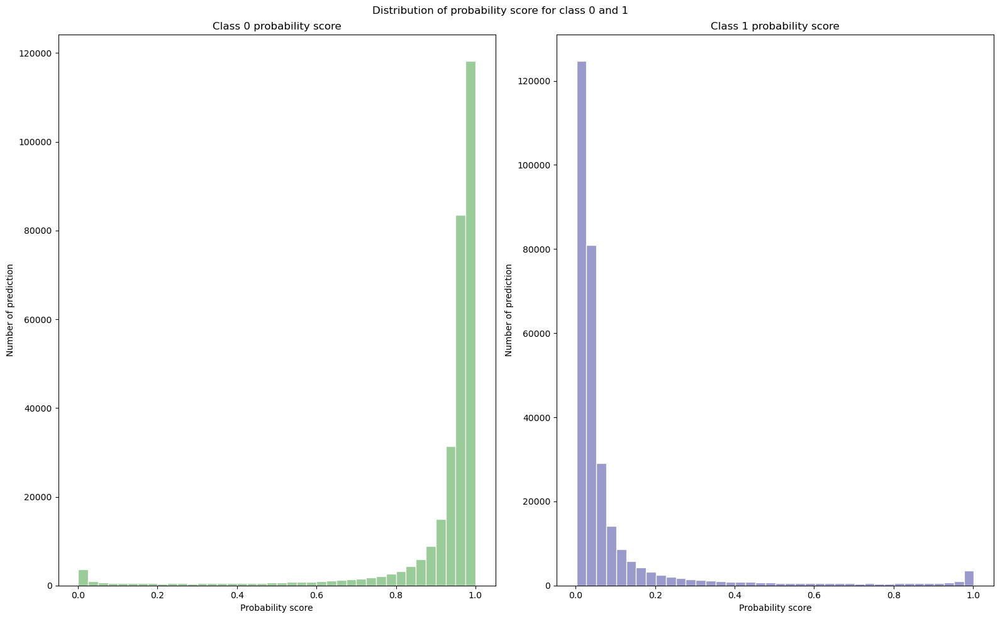

In [28]:
plot_confidence_score_histogram(predicted_probability_mlp_none)

# SHAP

In [81]:
explainer_none_shap = shap.Explainer(mlp_none.predict, X_test)

In [82]:
shap_values_none = explainer_none_shap(X_test[0:30000]) 

Exact explainer: 30001it [03:59, 119.76it/s]                           


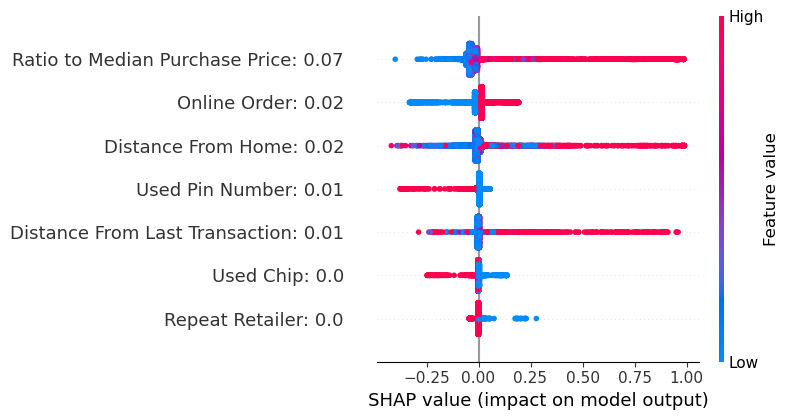

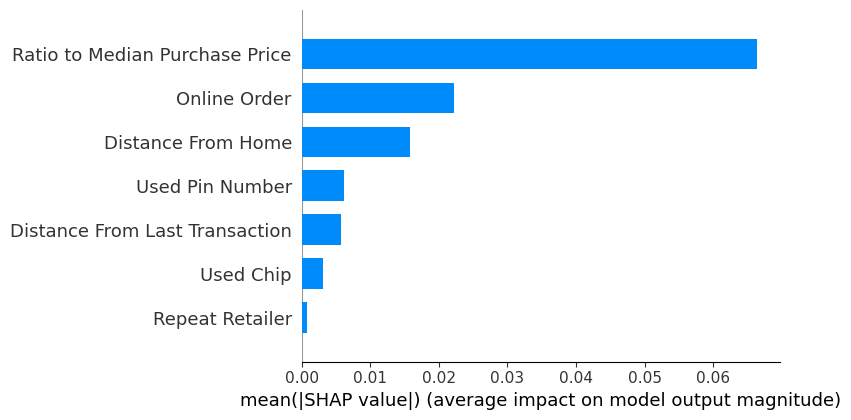

In [83]:
plot_SHAP(shap_values_none)

Here we can clearly see that Ratio to Median Purchase price was the largest factor in determining fraud. 

# LIME

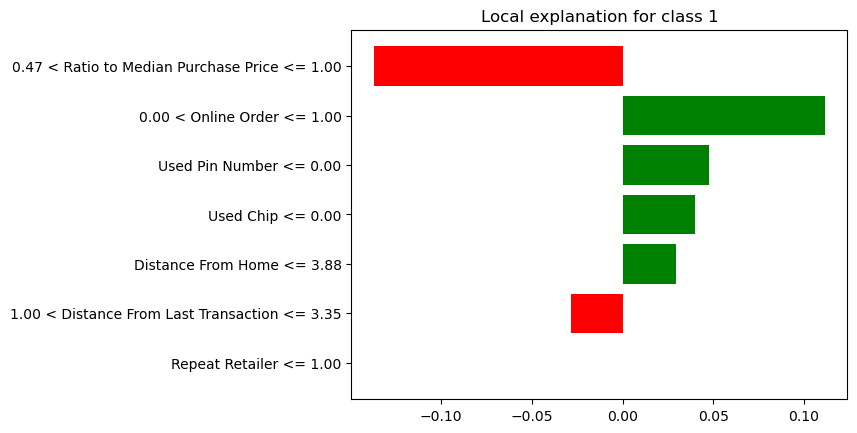

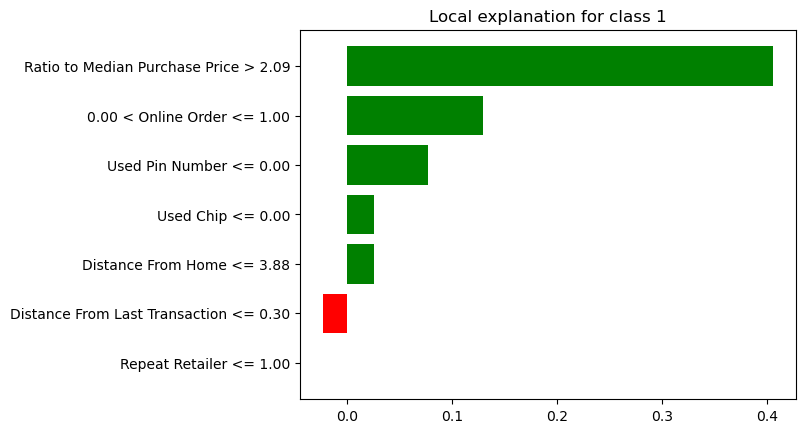

In [84]:
plot_LIME(X_train, X, X_test, 1, mlp_none)   # Non-fraudulent instance
plot_LIME(X_train, X, X_test, 0, mlp_none)   # Fraudulent instance

Note: 2nd lime graph is supposed to be titled Local Explanation for Class 0

In these 2 graphs we can also see for these instances, Ratio to median purchase price was the most significant factor in determining fraudulency. 

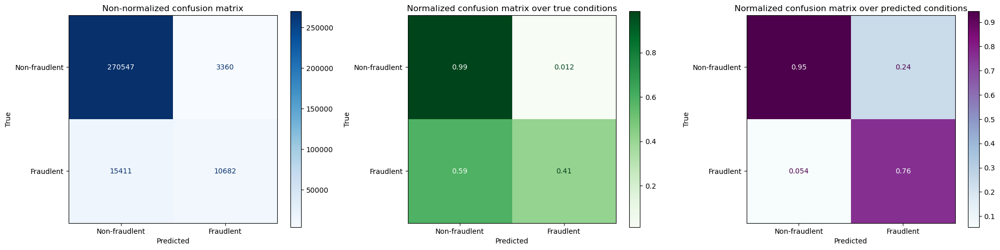

In [29]:
plot_confusion_matrix(y_test, predicted_mlp_none)

Plots the matrices as defined by the plot_confusion_matrix function. 
1. In the 2nd matrix, we want to minimize the bottom left square, but we can see in this case it is quite high, at 0.59.
2. In the third matrix, we want to minimize the top right, which is also not low enough at 0.24.

# Random Undersampling

In [48]:
mlp_classifier_rus = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(8, 2), random_state=11,max_iter=10000)
mlp_classifier_rus.fit(X_train_rus.to_numpy(),y_train_rus.to_numpy())
predicted_mlp_rus = mlp_classifier_rus.predict(X_test.to_numpy())
mlp_rus_accuracy_score = accuracy_score(predicted_mlp_rus,y_test)
predicted_probability_mlp_rus = mlp_classifier_rus.predict_proba(X_test)


In [49]:
model_metrics(mlp_rus_accuracy_score, predicted_probability_mlp_rus, predicted_mlp_rus)

The accuracy score for Random Under Sampling is 0.9235833333333333
The average confidence score of predicting class 0 - the non-fraudulent transactions - is 0.911529810377417
The average confidence score of predicting class 1 - the fraudulent transactions - is 0.911529810377417
              precision    recall  f1-score   support

         0.0       0.99      0.92      0.96    273907
         1.0       0.54      0.93      0.68     26093

    accuracy                           0.92    300000
   macro avg       0.76      0.92      0.82    300000
weighted avg       0.95      0.92      0.93    300000



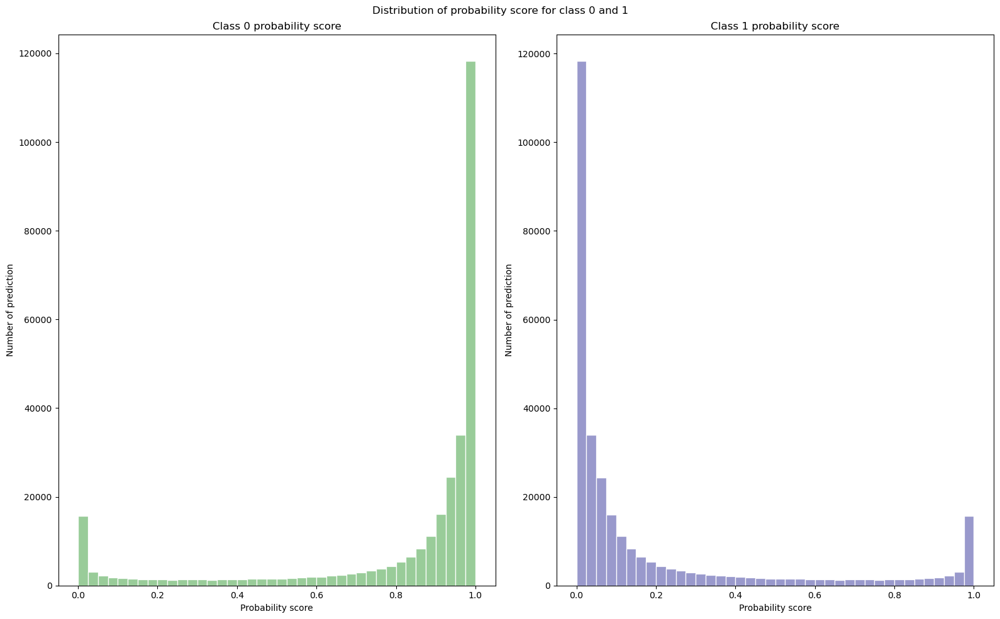

In [50]:
plot_confidence_score_histogram(predicted_probability_mlp_rus)

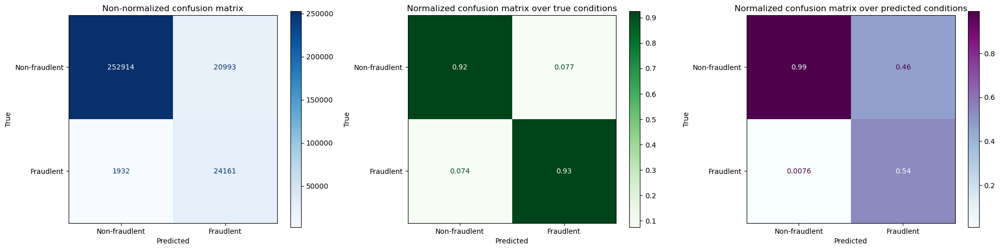

In [51]:
plot_confusion_matrix(y_test, predicted_mlp_rus)

1. With this model, its recall is quite low, at 0.07 false negative rate
2. Its precision, however, for false positives in quite high at 0.46.

# SHAP

In [52]:
explainer_rus_shap = shap.Explainer(mlp_classifier_rus.predict, X_test)

In [53]:
shap_values_rus = explainer_rus_shap(X_test[0:30000]) 

Exact explainer: 30001it [04:02, 121.24it/s]                           


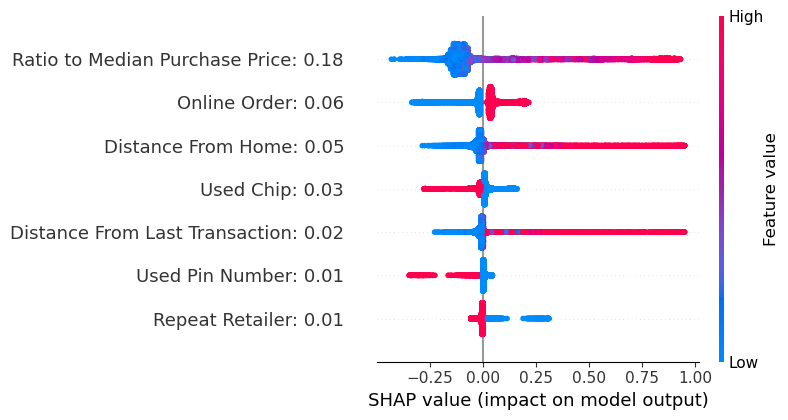

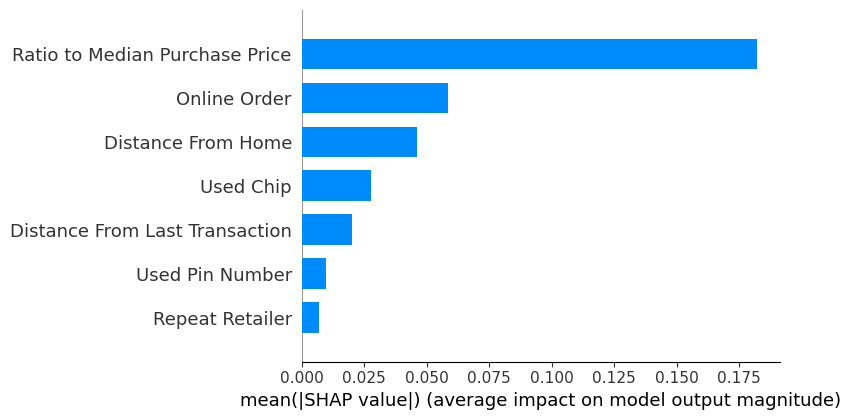

In [54]:
plot_SHAP(shap_values_rus)

# LIME

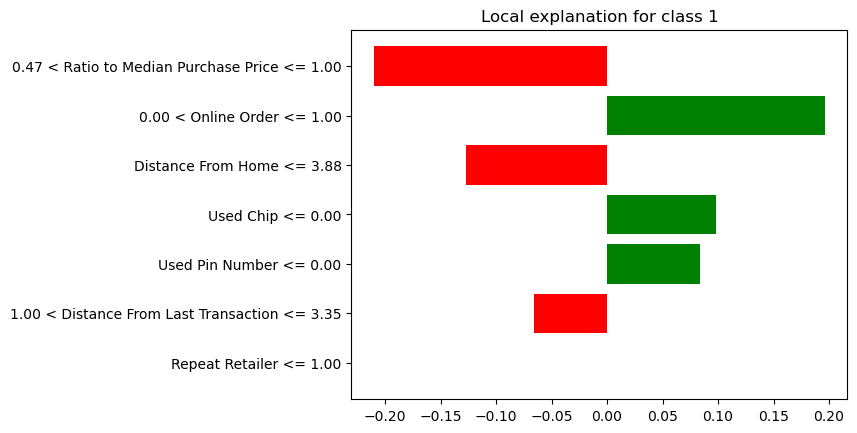

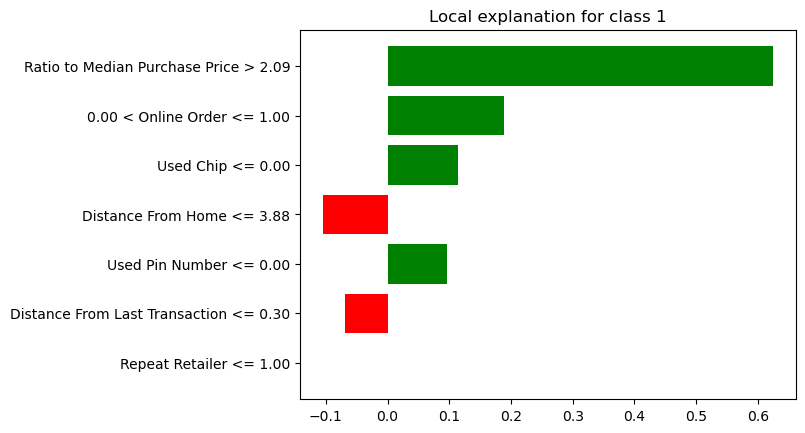

In [55]:
plot_LIME(X_train, X, X_test, 1, mlp_classifier_rus)   # Non-fraudulent instance
plot_LIME(X_train, X, X_test, 0, mlp_classifier_rus)   # Fraudulent instance

# Nearmiss Undersampling

In [56]:
mlp_classifier_nearmiss = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(8, 2), random_state=11,max_iter=10000)
mlp_classifier_nearmiss.fit(X_train_nearmiss.to_numpy(),y_train_nearmiss.to_numpy())
predicted_mlp_nearmiss = mlp_classifier_nearmiss.predict(X_test.to_numpy())


In [57]:
mlp_nearmiss_accuracy_score = accuracy_score(predicted_mlp_nearmiss,y_test)
predicted_probability_mlp_nearmiss = mlp_classifier_nearmiss.predict_proba(X_test)

In [58]:
model_metrics(mlp_nearmiss_accuracy_score, predicted_probability_mlp_nearmiss, predicted_mlp_nearmiss)

The accuracy score for Random Under Sampling is 0.9939433333333333
The average confidence score of predicting class 0 - the non-fraudulent transactions - is 0.9886957099031624
The average confidence score of predicting class 1 - the fraudulent transactions - is 0.9886957099031624
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    273907
         1.0       0.95      0.98      0.97     26093

    accuracy                           0.99    300000
   macro avg       0.98      0.99      0.98    300000
weighted avg       0.99      0.99      0.99    300000



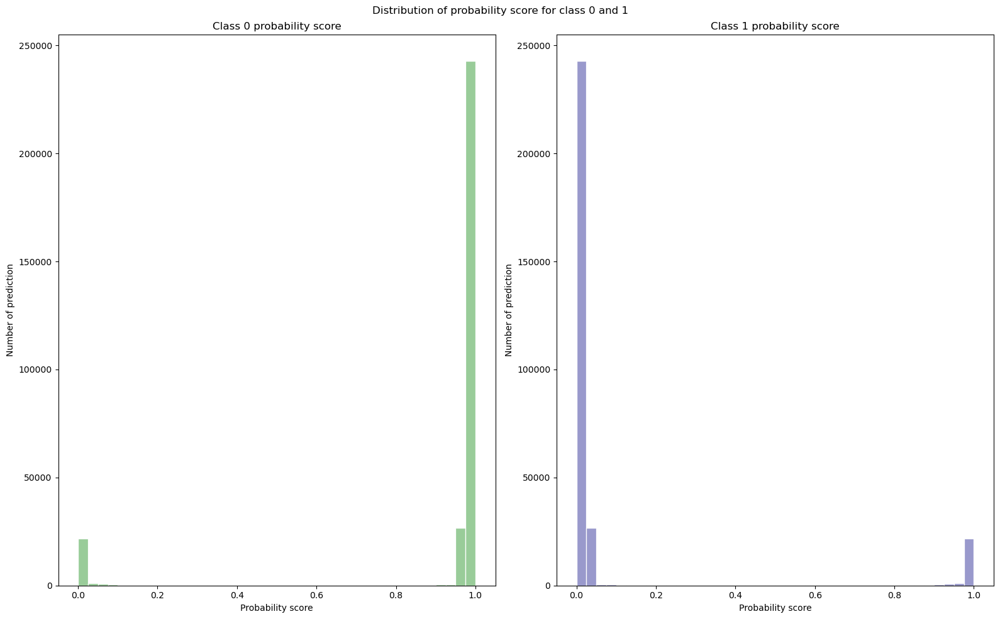

In [59]:
plot_confidence_score_histogram(predicted_probability_mlp_nearmiss)

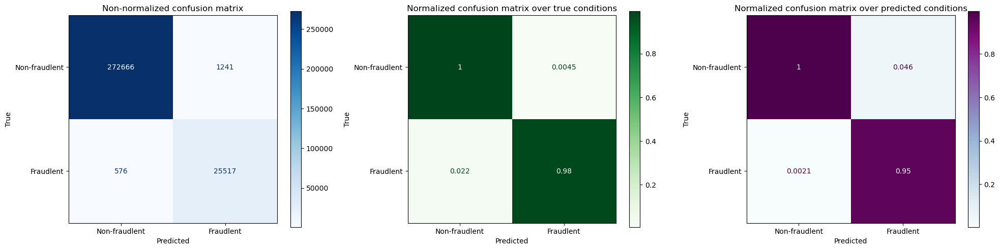

In [60]:
plot_confusion_matrix(y_test, predicted_mlp_nearmiss)

# SHAP

In [61]:
explainer_nearmiss_shap = shap.Explainer(mlp_classifier_nearmiss.predict, X_test)

In [62]:
shap_values_nearmiss = explainer_nearmiss_shap(X_test[0:30000]) 

Exact explainer: 30001it [04:09, 115.37it/s]                           


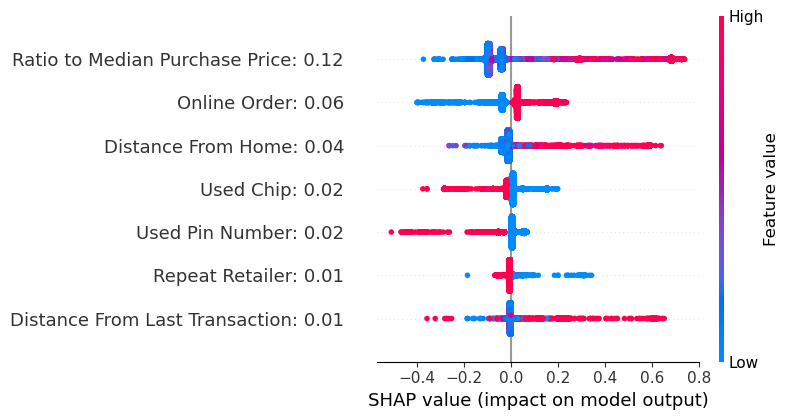

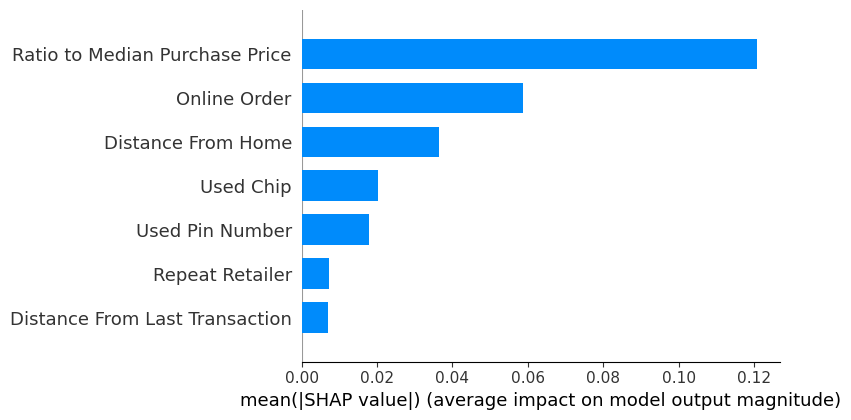

In [63]:
plot_SHAP(shap_values_nearmiss)

# LIME

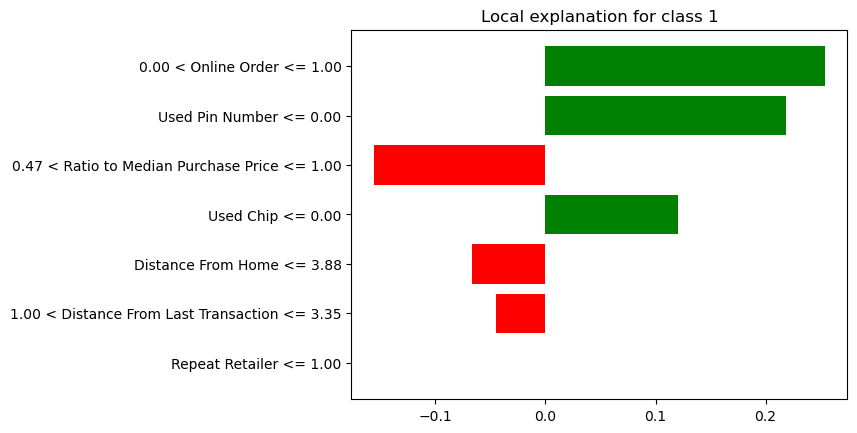

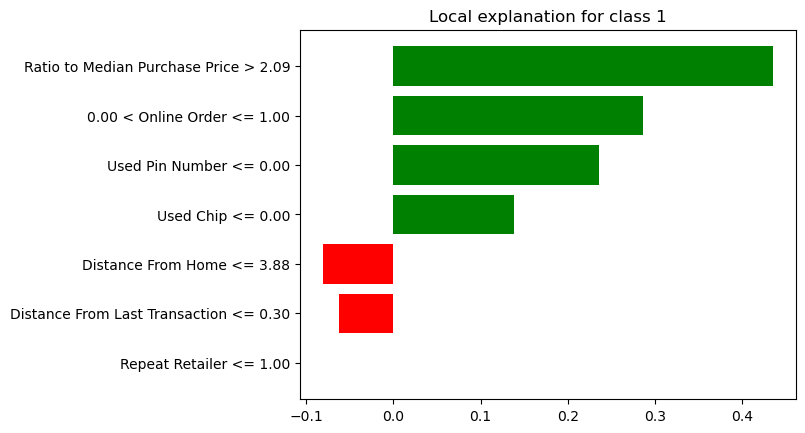

In [64]:
plot_LIME(X_train, X, X_test, 1, mlp_classifier_nearmiss)   # Non-fraudulent instance
plot_LIME(X_train, X, X_test, 0, mlp_classifier_nearmiss)

# Random Oversampling

In [65]:
mlp_ros = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(8, 2), random_state=11,max_iter=100000000000000)
mlp_ros.fit(X_train_ros.to_numpy(),y_train_ros.to_numpy())
predicted_mlp_ros = mlp_ros.predict(X_test.to_numpy())
predicted_probability_mlp_ros = mlp_ros.predict_proba(X_test)
mlp_ros_accuracy_score = accuracy_score(predicted_mlp_ros,y_test)

In [66]:
model_metrics(mlp_ros_accuracy_score, predicted_probability_mlp_ros, predicted_mlp_ros)

The accuracy score for Random Under Sampling is 0.9257333333333333
The average confidence score of predicting class 0 - the non-fraudulent transactions - is 0.9132925204342867
The average confidence score of predicting class 1 - the fraudulent transactions - is 0.9132925204342867
              precision    recall  f1-score   support

         0.0       0.99      0.93      0.96    273907
         1.0       0.54      0.93      0.69     26093

    accuracy                           0.93    300000
   macro avg       0.77      0.93      0.82    300000
weighted avg       0.95      0.93      0.93    300000



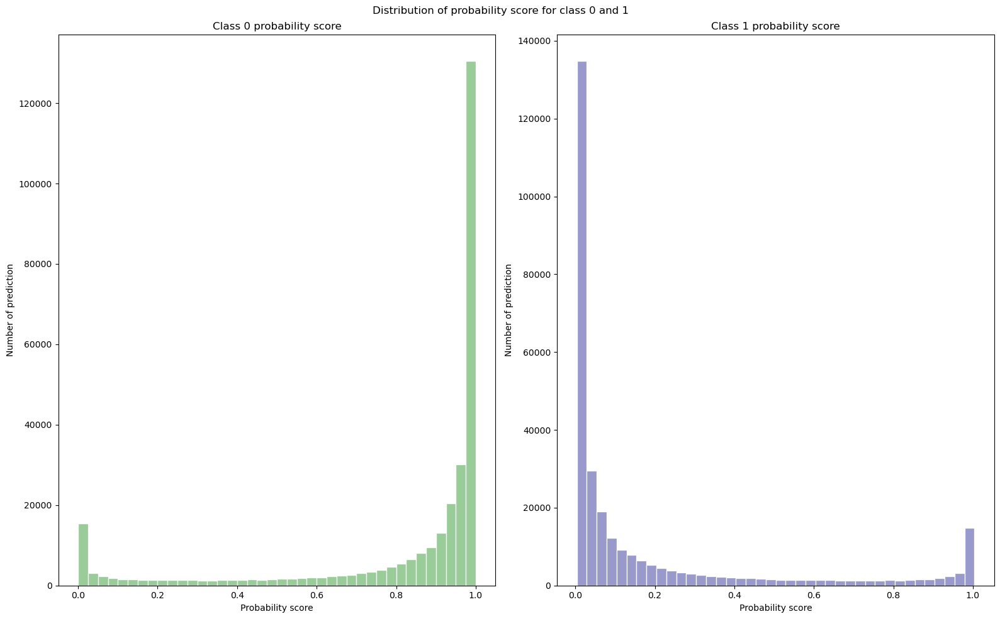

In [67]:
plot_confidence_score_histogram(predicted_probability_mlp_ros)

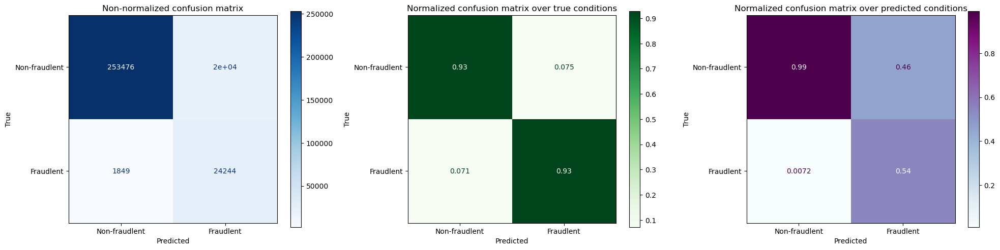

In [68]:
plot_confusion_matrix(y_test, predicted_mlp_ros)

In [69]:
explainer_ros_shap = shap.Explainer(mlp_ros.predict, X_test)

In [70]:
shap_values_ros = explainer_ros_shap(X_test[0:30000]) 

Exact explainer: 30001it [04:01, 119.15it/s]                           


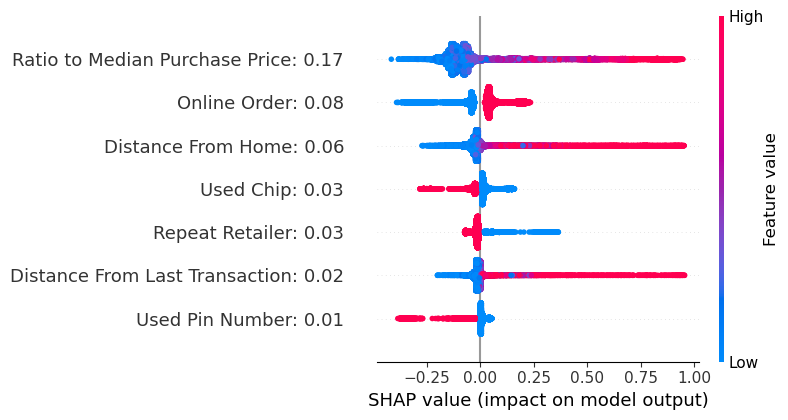

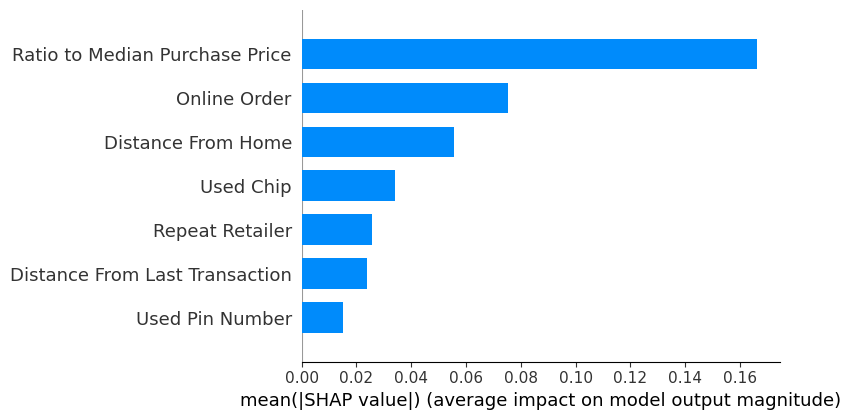

In [71]:
plot_SHAP(shap_values_ros)

# LIME

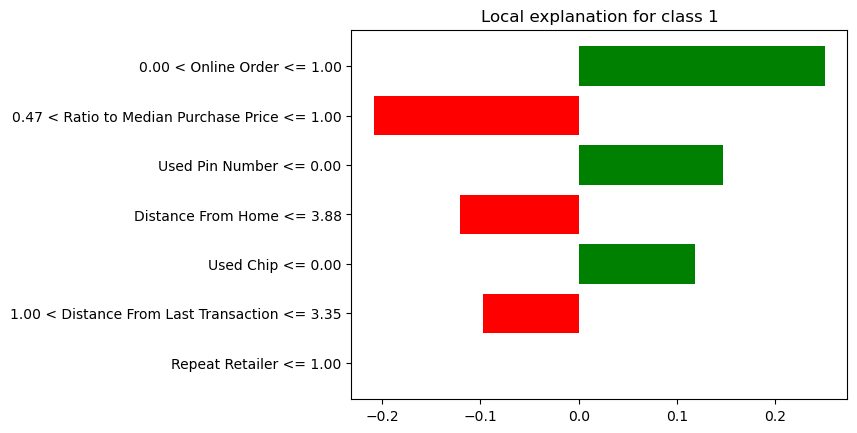

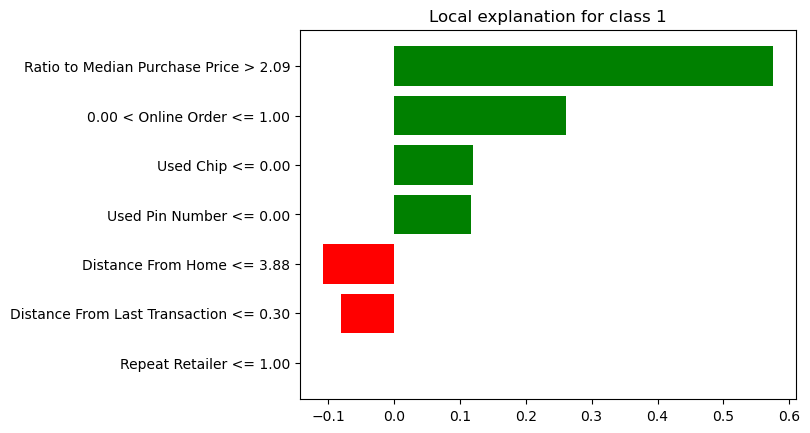

In [72]:
plot_LIME(X_train, X, X_test, 1, mlp_ros)   # Non-fraudulent instance
plot_LIME(X_train, X, X_test, 0, mlp_ros)

# SMOTE Oversampling

In [73]:
mlp_smote = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(8, 2), random_state=11,max_iter=10000)
mlp_smote.fit(X_train_smote.to_numpy(),y_train_smote.to_numpy())
predicted_mlp_smote = mlp_smote.predict(X_test.to_numpy())
predicted_probability_mlp_smote = mlp_smote.predict_proba(X_test)
mlp_smote_accuracy_score = accuracy_score(predicted_mlp_smote,y_test)

In [74]:
model_metrics(mlp_smote_accuracy_score, predicted_probability_mlp_smote, predicted_mlp_smote)

The accuracy score for Random Under Sampling is 0.92921
The average confidence score of predicting class 0 - the non-fraudulent transactions - is 0.908299902078875
The average confidence score of predicting class 1 - the fraudulent transactions - is 0.908299902078875
              precision    recall  f1-score   support

         0.0       0.99      0.93      0.96    273907
         1.0       0.55      0.95      0.70     26093

    accuracy                           0.93    300000
   macro avg       0.77      0.94      0.83    300000
weighted avg       0.96      0.93      0.94    300000



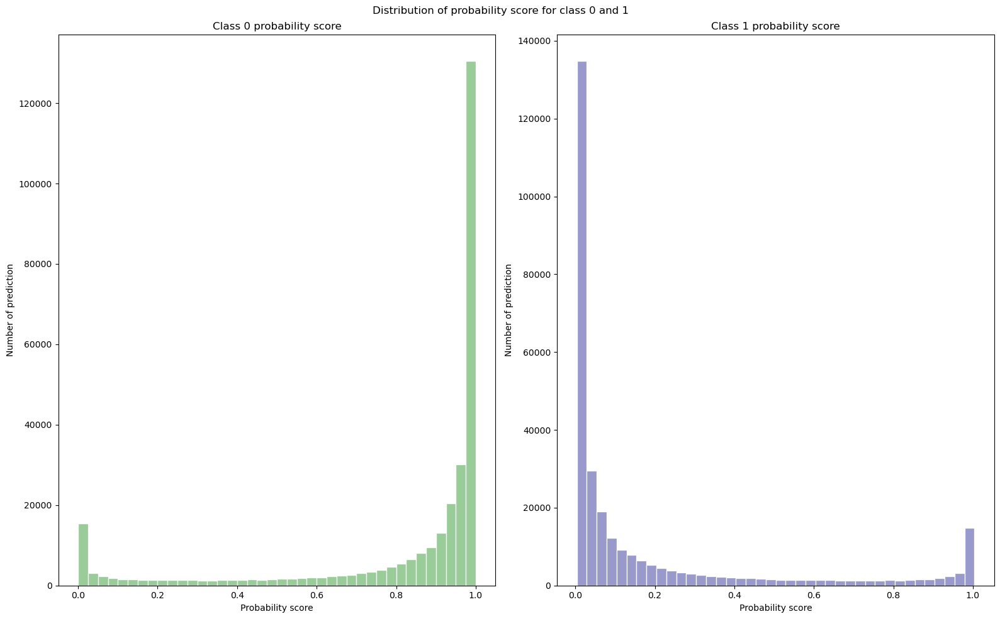

In [75]:
plot_confidence_score_histogram(predicted_probability_mlp_ros)

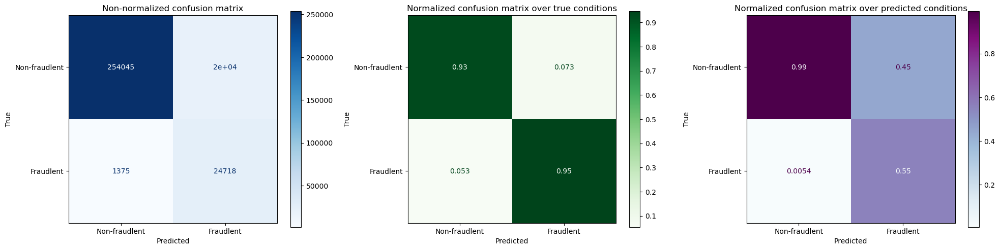

In [76]:
plot_confusion_matrix(y_test, predicted_mlp_smote)

1. For the smote model, the false negative rate is 0.053, which is quite low
2. However, the false positive in the precision matrix is 0.45, which is higher than we want

In [77]:
explainer_smote_shap = shap.Explainer(mlp_smote.predict, X_test)

In [78]:
shap_values_smote = explainer_smote_shap(X_test[0:30000]) 

Exact explainer: 30001it [03:57, 120.74it/s]                           


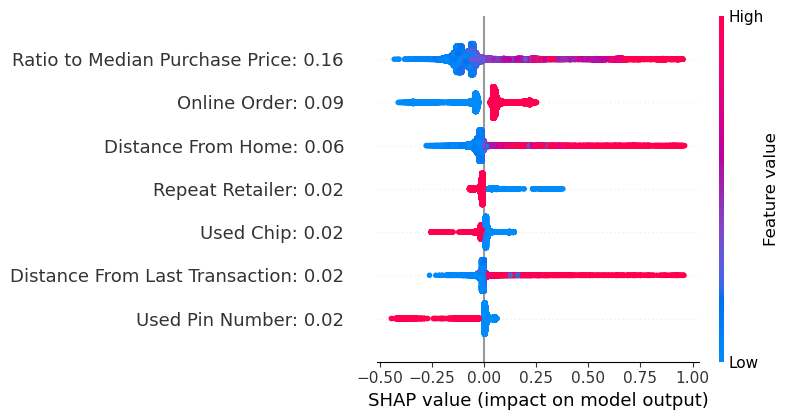

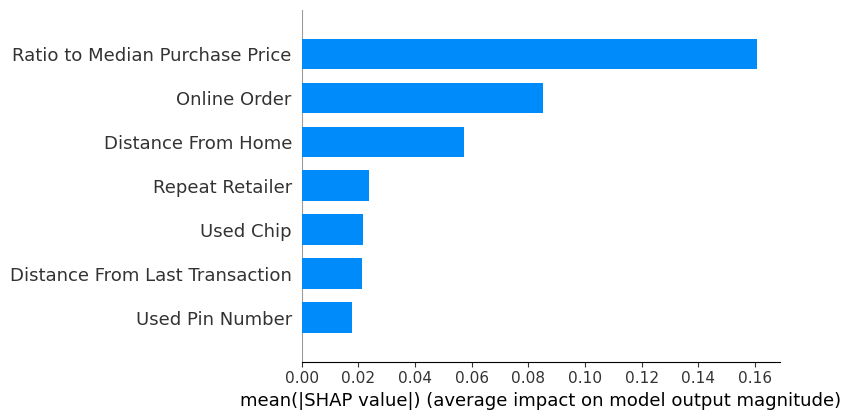

In [79]:
plot_SHAP(shap_values_smote)

# LIME

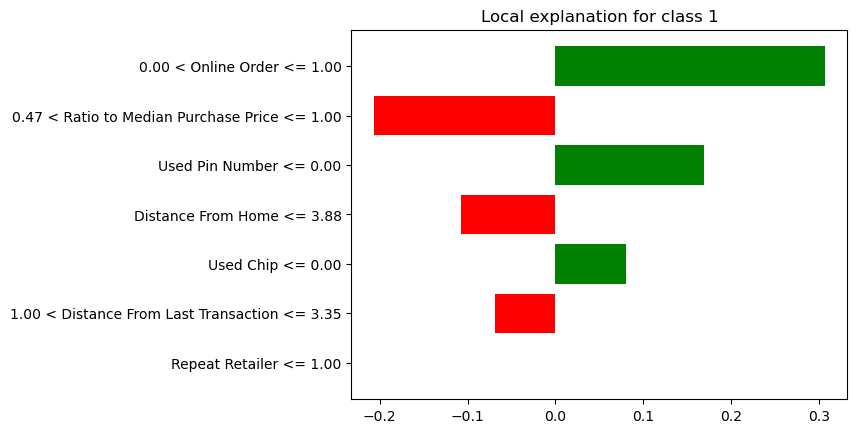

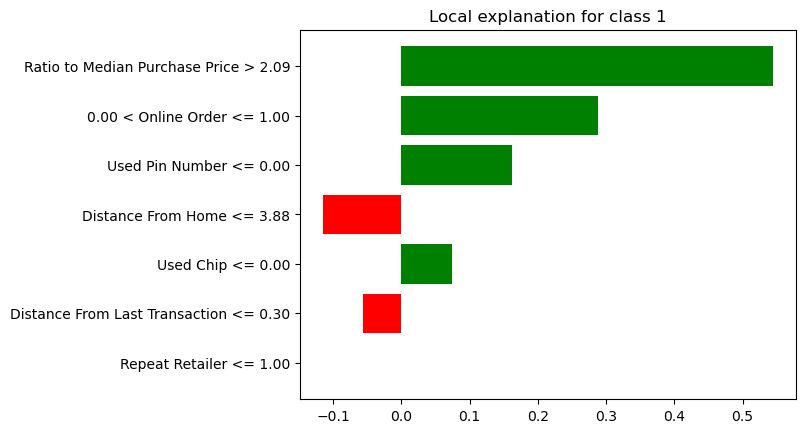

In [80]:
plot_LIME(X_train, X, X_test, 1, mlp_smote)   # Non-fraudulent instance
plot_LIME(X_train, X, X_test, 0, mlp_smote)

In all the SHAP and LIME explanations, we can see that Ratio to Median Purchase Price were the highest weighted factors. 

# Storing


In [86]:
try:
    import pickle
    
except:
    !pip install pickle
    import pickle

    
best_classifer = mlp_classifier_nearmiss

file_to_write = open("mlp_credit_card_fraud_detection_best_model.saved","wb")
pickle.dump(best_classifer,file_to_write)
file_to_write.close()

Stores the best model using pickle for demo purposes